In [1]:
from IPython.display import display, Image
import base64, json, os, glob,sys

In [2]:
def display_record(record_path):
    
    with open(record_path, 'r') as file:
        record = json.load(file)
        
    for content in record:
        role = content["role"]
        content = content["content"]
        
        print(f"ROLE: {role}:\n")
        
        for block in content:
            if block["type"] == "text":
                print(block["text"].replace("\n", "\n").replace("_","_"))
                
            elif block["type"] == "image_url":
                base64_str = block["image_url"]["url"]
                display(Image(data=base64.b64decode(base64_str)))
                
        print("\n\n-------------------\n\n")

ROLE: user:

Here are some tools that can help you. All are python codes. They are in tools.py and will be imported for you.
The images has their own coordinate system. The upper left corner of the image is the origin (0, 0). All coordinates are normalized, i.e., the range is [0, 1].
All bounding boxes are in the format of [x, y, w, h], which is a python list. x is the horizontal coordinate of the upper-left corner of the box, y is the vertical coordinate of that corner, w is the box width, and h is the box height.
Notice that you, as an AI assistant, is not good at locating things and describe them with coordinate. You can use tools to generate bounding boxes.
You are also not good at answering questions about small visual details in the image. You can use tools to zoom in on the image to see the details. Below are the tools in tools.py:
```python
class AnnotatedImage:
    # A class to represent an annotated image. It contains the annotated image and the original image.
    
    def _

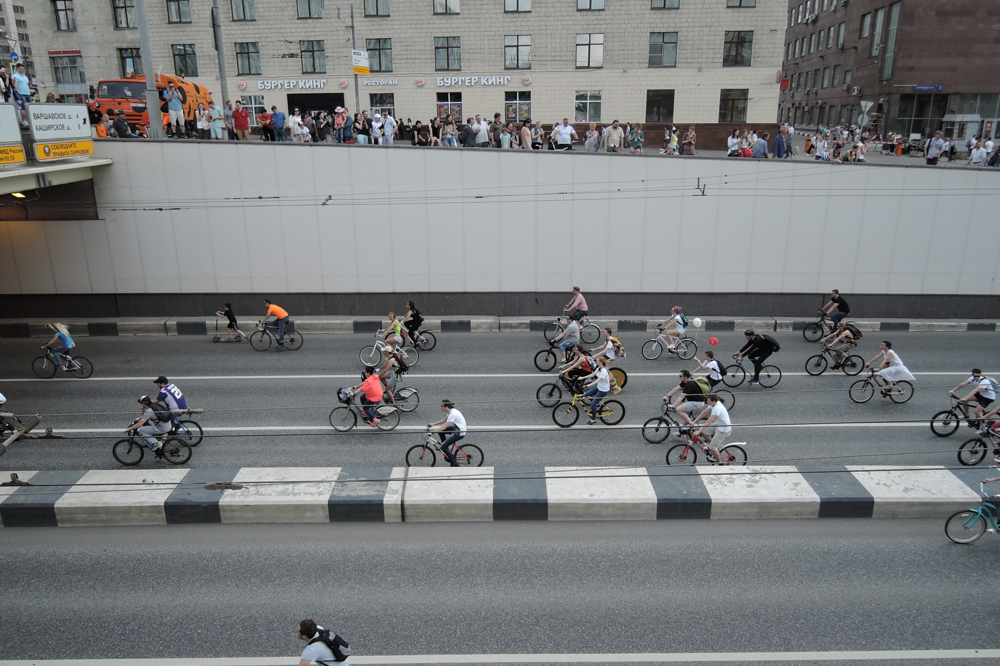

 Is the red balloon above or below the white balloon? Options: (A) The red balloon is below the white balloon. (B) The red balloon is above the white balloon.
# USER IMAGE stored in image_1 as PIL image.
Now please generate only THOUGHT 0 and ACTION 0 in RESULT. If no action needed, also reply with ANSWER: <your answer> and ends with TERMINATE in the RESULT:
# RESULT #:



-------------------


ROLE: assistant:

# RESULT #:
THOUGHT 0: To determine the relative positions of the red and white balloons, I need to detect the balloons in the image. I will use the detection tool to find the balloons.
ACTION 0:
```python
image_1_balloon_detection, image_1_balloon_boxes = detection(image_1, ["red balloon", "white balloon"])
display(image_1_balloon_detection.annotated_image)
```


-------------------


ROLE: user:

OBSERVATION: Execution success. The output is as follows:



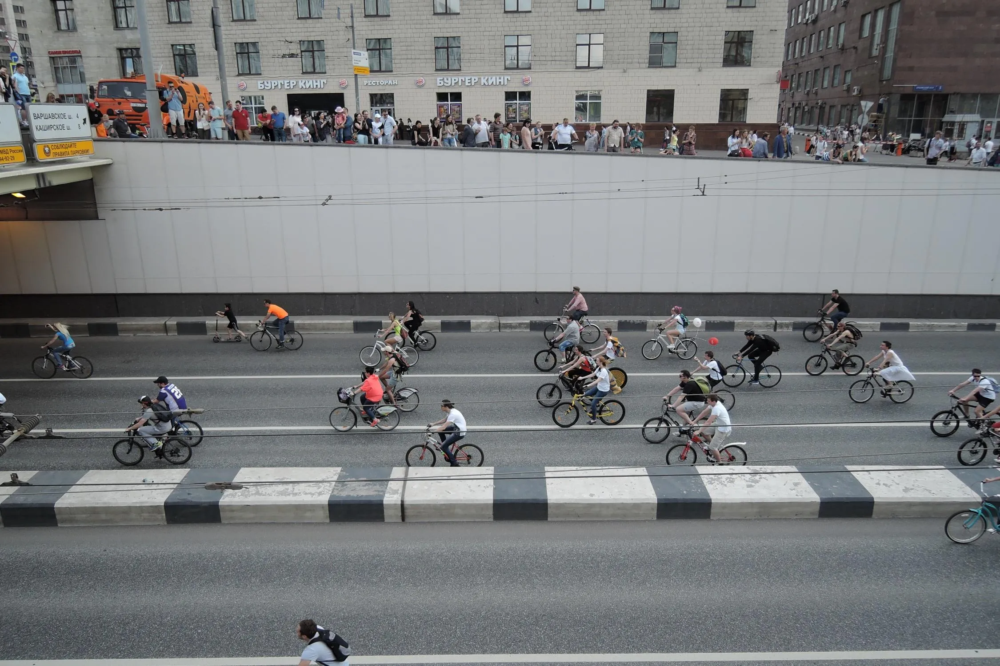



Please generate the next THOUGHT and ACTION. If you can get the answer, please also reply with ANSWER: <your answer> and ends with TERMINATE.


-------------------


ROLE: assistant:

THOUGHT 1: The detection tool did not annotate the balloons in the image. I will use the sliding_window_detection tool to search for the red and white balloons in the image.

ACTION 1:
```python
possible_patches, possible_boxes = sliding_window_detection(image_1, ["red balloon", "white balloon"])
for i, patch in enumerate(possible_patches):
    print(f"Patch {i+1}:")
    display(patch.annotated_image)
```


-------------------


ROLE: user:

OBSERVATION: Execution success. The output is as follows:
Patch 1:




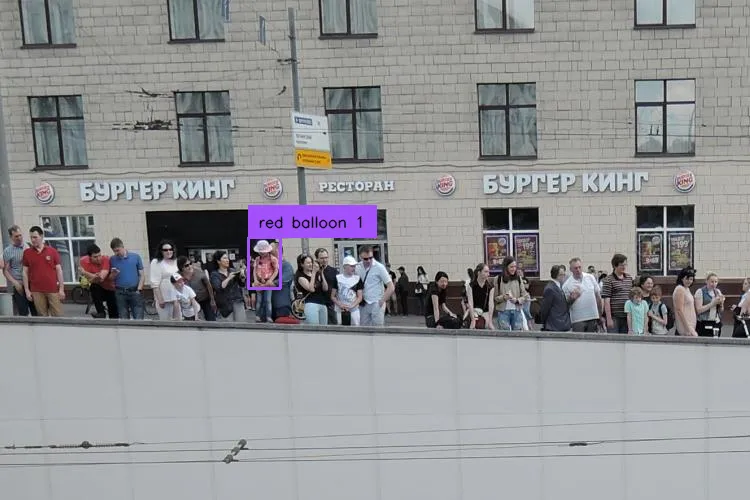


Patch 2:




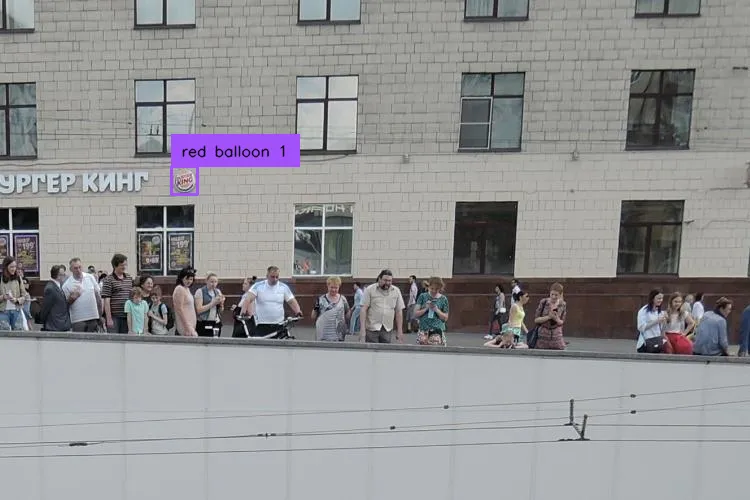


Patch 3:




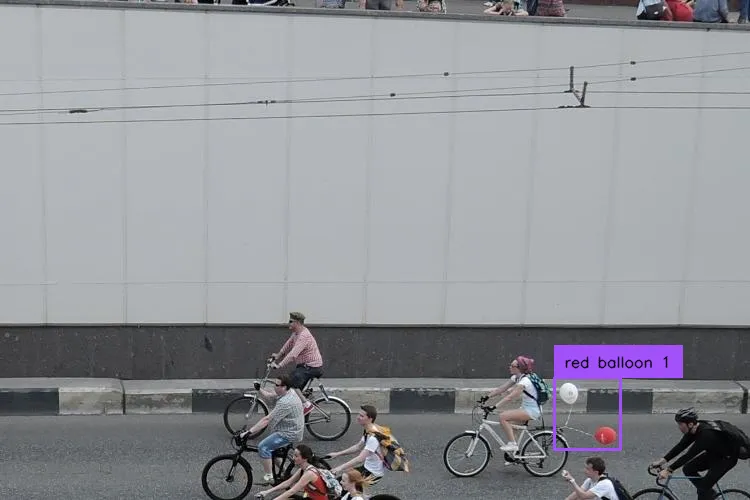


Patch 4:




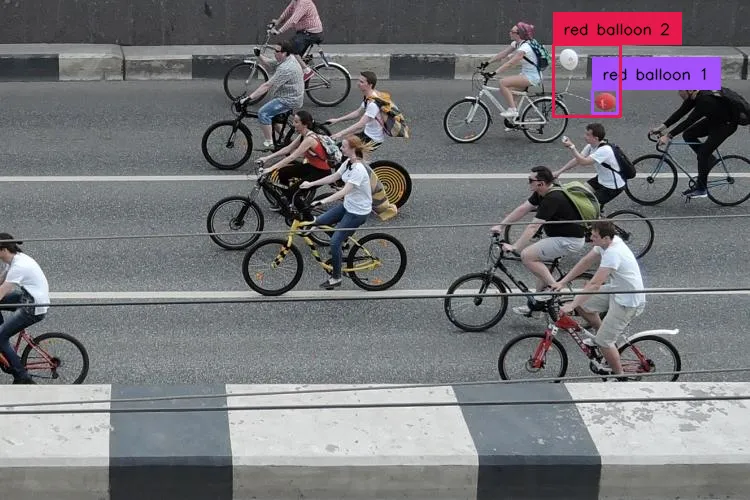


Patch 5:




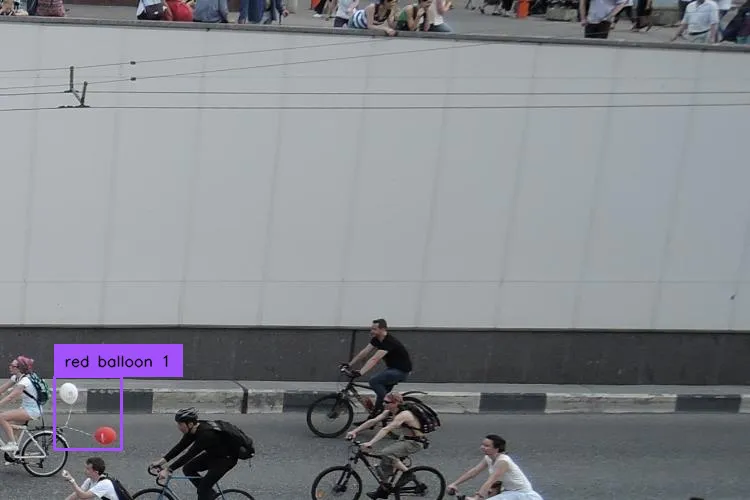



Please generate the next THOUGHT and ACTION. If you can get the answer, please also reply with ANSWER: <your answer> and ends with TERMINATE.


-------------------


ROLE: assistant:

THOUGHT 2: From Patch 4 and Patch 5, I can see both the red and white balloons. The red balloon is clearly below the white balloon in these patches. 

ACTION 2: No action needed.
ANSWER: The red balloon is below the white balloon. So the answer is (A). TERMINATE


-------------------




In [3]:
display_record('outputs/vstar/relative_position@sa_46221/output.json')